## LLM Architecture.

<div class="alert alert-block alert-success">

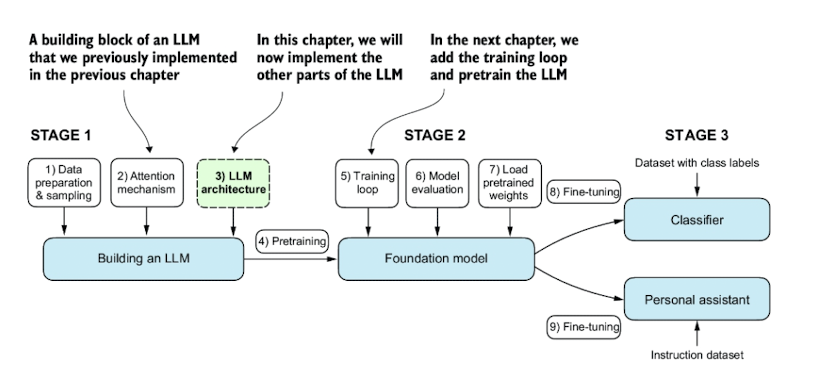

The three main stages of coding an LLM. We will continue to focus on step 3 of stage 1: implementing the LLM architecture.

</div>

<div class="alert alert-block alert-info">

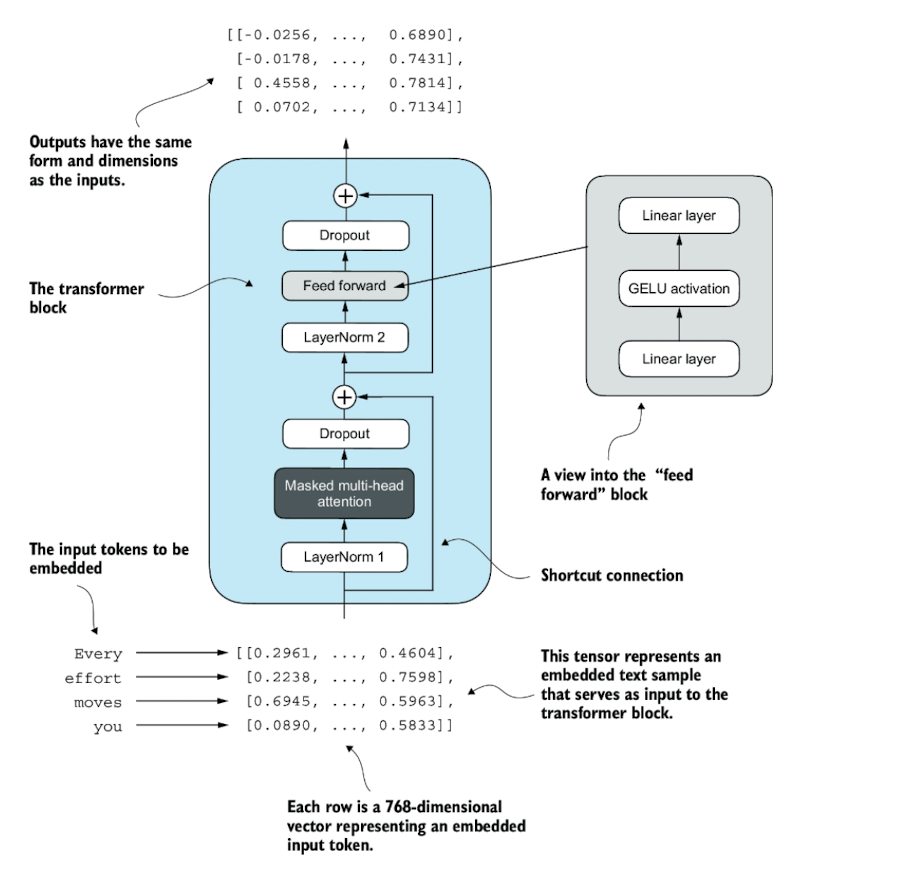

An illustration of a transformer block. Input tokens have been embedded into 768-dimensional vectors. Each row corresponds to one token’s vector representation. The outputs of the transformer block are vectors of the same dimension as the input, which can then be fed into subsequent layers in an LLM.

</div>

<div class="alert alert-block alert-success">

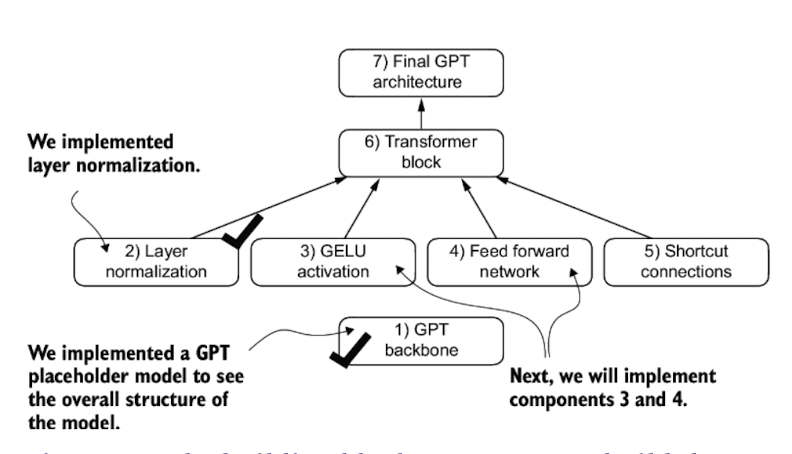

The building blocks necessary to build the GPT architecture. So far, we have completed the GPT backbone and layer normalization. Next, we will focus on GELU activation and the feed forward network.

</div>

## GPT ARCHITECTURE PART 3: FEEDFORWARD NEURAL NETWORK WITH GELU ACTIVATION

<div class="alert alert-block alert-info">
Historically, the ReLU activation function has been commonly used in deep learning due to its simplicity and effectiveness across various neural network architectures. However, in LLMs, several other activation functions are employed beyond the traditional ReLU. Two notable examples are GELU (Gaussian error linear unit) and SwiGLU (Swish-gated linear unit).

Below is the ReLU function

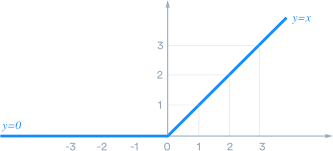

The ReLU activation function is characterized by being flat at zero for negative values of X, and linear for positive values. This can lead to certain issues, such as the function not being differentiable at X equals zero due to a sharp transition. Additionally, for all values of X less than zero, the output remains zero, which can result in the 'dead neuron' problem when integrated into neural networks.

When the output from a layer is negative and the ReLU activation function is applied, the output becomes zero and remains zero. This results in a situation where learning cannot proceed, as the neurons associated with that output do not contribute to the learning process. Consequently, once a neuron's output becomes negative, it ceases to play a role in learning, leading to what is known as the 'dead neuron' problem.

</div>

<div class="alert alert-block alert-success">
<h2> Gelu Activation Funtion </h2>

Figure below shows the Gaussian Distribution function

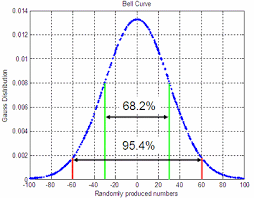

<h3> Cummulative Gaussian Distibution Function </h3>

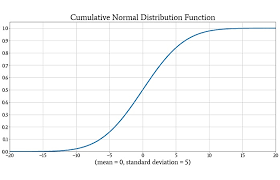

The Gelu Distribution function is defined as 
GELU(x) = x* $\phi$(x) , where $\phi$  is the Cumulative Gaussian distribution

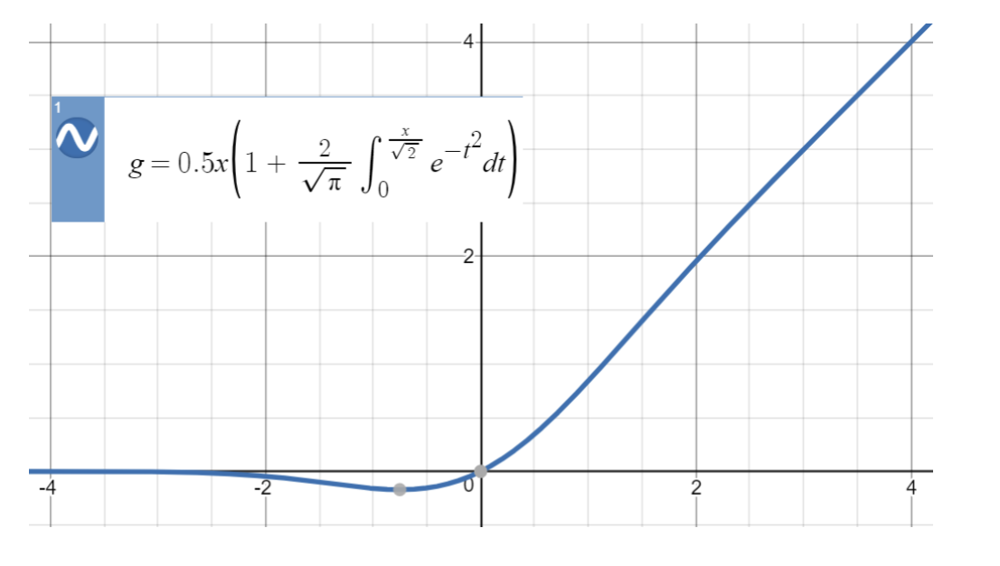


For positive values of x, the Gelu function approaches x as x increases, indicating that for very high values of x, Gelu(x) tends to x, similar to the positive branch of the ReLU activation function. However, the behavior for negative values of x is notably different; Gelu does not equal zero, meaning x is multiplied by these negative values, unlike ReLU where the output is zero for negative x. This solves the dead neuron problem.

Instead of utilizing the complex cumulative distribution function, people typically opt for an approximation of the GeLU activation. The approximation used in training GPT-2 is depicted below.

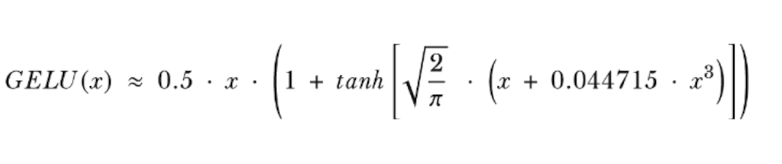

It is common to implement a computationally cheaper approximation (the original GPT-2 model was also trained with this approximation, which was found via curve fitting) shown above.

</div>

<div class="alert alert-block alert-success">

Let's implement the GELU activation function approximation used by GPT-2:

</div>

In [1]:
import torch
import torch.nn as nn

class GELU(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return 0.5 * x * (1 + torch.tanh(
            torch.sqrt(torch.tensor(2.0 / torch.pi)) * 
            (x + 0.044715 * torch.pow(x, 3))
        ))

<div class="alert alert-block alert-success">

To get an idea of what this GELU function looks like and how it compares to the ReLU
function, let's plot these functions side by side:
</div>

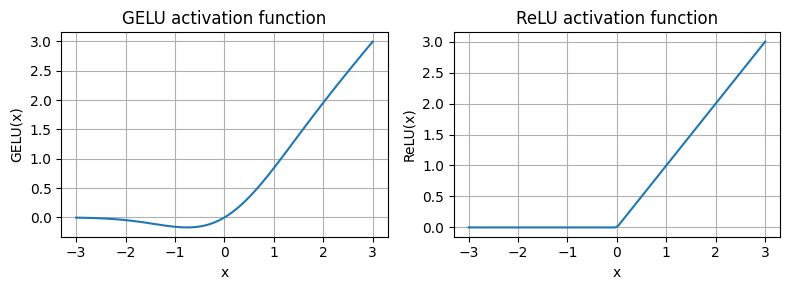

In [2]:
import matplotlib.pyplot as plt

gelu, relu = GELU(), nn.ReLU()

# Some sample data
x = torch.linspace(-3, 3, 100)
y_gelu, y_relu = gelu(x), relu(x)

plt.figure(figsize=(8, 3))
for i, (y, label) in enumerate(zip([y_gelu, y_relu], ["GELU", "ReLU"]), 1):
    plt.subplot(1, 2, i)
    plt.plot(x, y)
    plt.title(f"{label} activation function")
    plt.xlabel("x")
    plt.ylabel(f"{label}(x)")
    plt.grid(True)

plt.tight_layout()
plt.show()


<div class="alert alert-block alert-info">

As we can see in the resulting plot in figure  ReLU (right) is a piecewise linear function that outputs the input directly if it is positive; otherwise, it outputs zero. GELU (left) is a smooth, nonlinear function that approximates ReLU but with a non-zero gradient for almost all negative values (except at approximately x = –0.75).

</div>

<div class="alert alert-block alert-warning">

The smoothness of GELU, as shown in the above figure, can lead to better optimization properties
during training, as it allows for more nuanced adjustments to the model's parameters. 

In contrast, ReLU has a sharp corner at zero, which can sometimes make optimization harder,
especially in networks that are very deep or have complex architectures. 

Moreover, unlike RELU, which outputs zero for any negative input, GELU allows for a small, non-zero output
for negative values. 

This characteristic means that during the training process, neurons that
receive negative input can still contribute to the learning process, albeit to a lesser extent
than positive inputs.

</div>

<h2> Feed Forward Block in Transformer</h2>

<div class="alert alert-block alert-success">

Next, let's use the GELU function to implement the small neural network module,
FeedForward, that we will be using in the LLM's transformer block later:
</div>

In [3]:
GPT_CONFIG_124M = {
    "vocab_size": 50257,    # Vocabulary size - tiktoken bpe
    "context_length": 1024, # Context length
    "emb_dim": 768,         # Embedding dimension
    "n_heads": 12,          # Number of attention heads
    "n_layers": 12,         # Number of layers
    "drop_rate": 0.1,       # Dropout rate
    "qkv_bias": False       # Query-Key-Value bias
}

In [4]:
class FeedForward(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(cfg["emb_dim"], 4 * cfg["emb_dim"]),
            GELU(),
            nn.Linear(4 * cfg["emb_dim"], cfg["emb_dim"]),
        )

    def forward(self, x):
        return self.layers(x)

In [5]:
print(GPT_CONFIG_124M["emb_dim"])


768


<div class="alert alert-block alert-info">

As we can see in the preceding code, the FeedForward module is a small neural network
consisting of two Linear layers and a GELU activation function. 

In the 124 million parameter GPT model, it receives the input batches with tokens that have an embedding
size of 768 each via the GPT_CONFIG_124M dictionary where GPT_CONFIG_124M["emb_dim"]
= 768.
</div>

<div class="alert alert-block alert-info">
Figure below shows how the embedding size is manipulated inside this small feed forward neural network when we pass it some inputs.

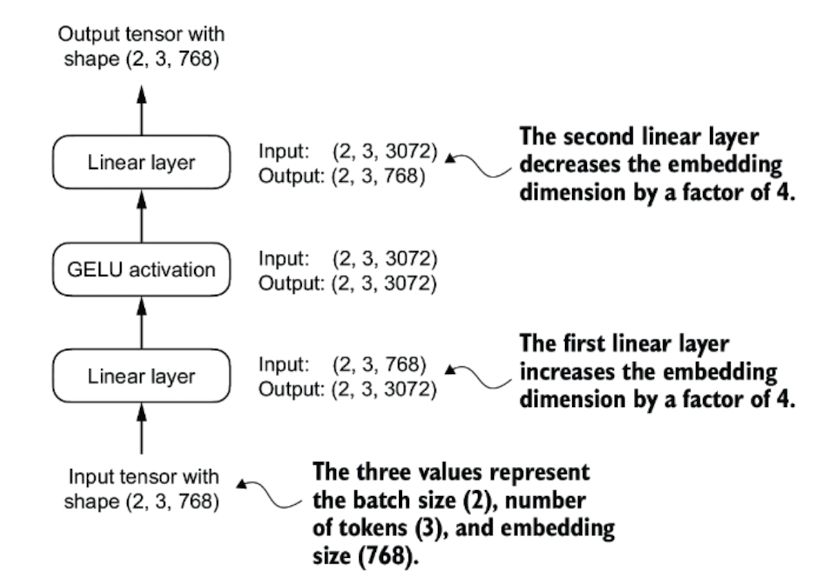

An overview of the connections between the layers of the feed forward neural network. This neural network can accommodate variable batch sizes and numbers of tokens in the input. However, the embedding size for each token is determined and fixed when initializing the weights.

</div>

<div class="alert alert-block alert-warning">
The FeedForward module plays a crucial role in enhancing the model’s ability to learn from and generalize the data. Although the input and output dimensions of this module are the same, it internally expands the embedding dimension into a higher-dimensional space through the first linear layer, as illustrated in figure below. This expansion is followed by a nonlinear GELU activation and then a contraction back to the original dimension with the second linear transformation. Such a design allows for the exploration of a richer representation space.

 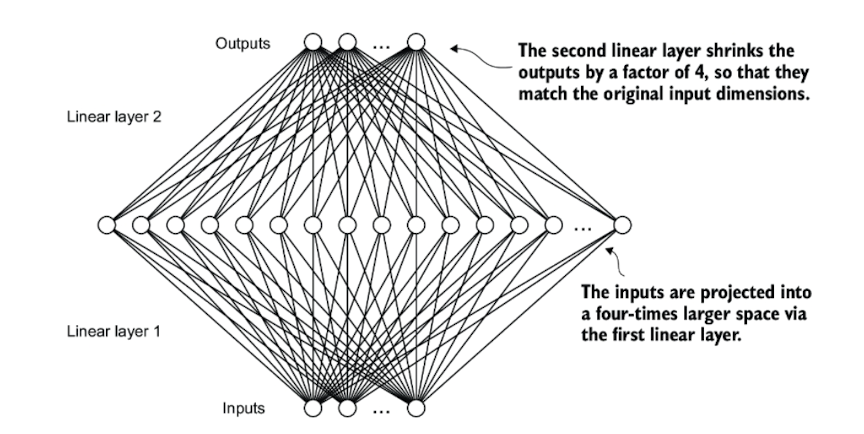

An illustration of the expansion and contraction of the layer outputs in the feed forward neural network. First, the inputs expand by a factor of 4 from 768 to 3,072 values. Then, the second layer compresses the 3,072 values back into a 768-dimensional representation.
</dev>

<div class="alert alert-block alert-success">

Let's use the GELU function to implement the small neural network module,
FeedForward, that we will be using in the LLM's transformer block later:
</div>

In [6]:
ffn = FeedForward(GPT_CONFIG_124M)
x = torch.rand(2, 3, 768) #A
out = ffn(x)
print(out.shape)

torch.Size([2, 3, 768])


<div class="alert alert-block alert-warning">
A key advantage of the Transformer block is that it maintains the dimensionality of the token. Even when passing through multiple layers, the token's dimensionality remains at 768 throughout the entire process. This is a significant benefit of the Transformer's design.
The uniformity in input and output dimensions simplifies the architecture by
enabling the stacking of multiple layers, as we will do later, without the need to adjust
dimensions between them, thus making the model more scalable.
</div>

## GPT ARCHITECTURE PART 4: SHORTCUT CONNECTIONS

<div class="alert alert-block alert-success">

Originally, shortcut connections were proposed for deep networks in computer vision (specifically, in residual networks) to mitigate the challenge of vanishing gradients. The vanishing gradient problem refers to the issue where gradients (which guide weight updates during training) become progressively smaller as they propagate backward through the layers, making it difficult to effectively train earlier layers. 
</div>

<div class="alert alert-block alert-info">

<h3> What is the vanishing gradient problem</h3>

The primary issue at hand is that gradients tend to diminish progressively as they are propagated backward through a neural network. When these gradients become exceedingly small, the updates to the model's weights are negligible, leading to stagnant learning. Consequently, the convergence of the model is delayed, impeding the learning process and preventing the large language model (LLM) from effectively acquiring new knowledge or improving its performance. This phenomenon, known as vanishing gradients, poses a significant challenge in training deep neural networks, as it hampers the model's ability to optimize efficiently and adapt to new data.

See figure below

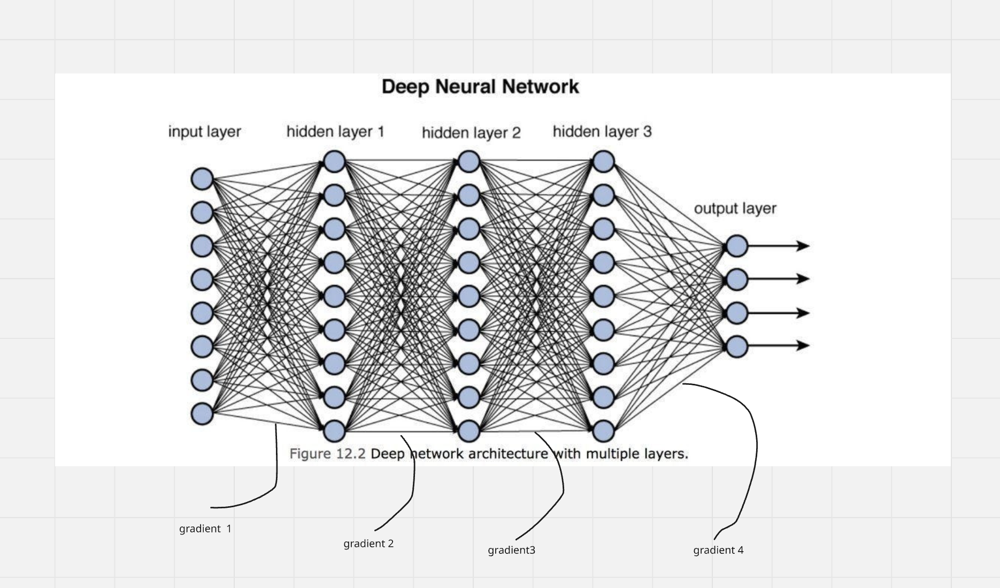


During the backward pass in a neural network, we compute gradients concerning all weights within a specific layer. When referring to "gradient 4," it signifies the matrix of gradients in the output layer. Similarly, "gradient 3" corresponds to the matrix of gradients in hidden layer three, "gradient 2" pertains to hidden layer two, and "gradient 1" represents the matrix of gradients in hidden layer one. Understanding the direction of gradient flow is crucial; it always proceeds from the neural network's output toward its input, moving from right to left. Consequently, we first determine gradient 4, which is then utilized to calculate gradient 3, followed by gradient 2, and finally gradient 1, involving multiplication operations along the way.

If gradient 4 becomes very small, multiplying it with back-propagated values results in gradient 3 being even smaller, gradient 2 even tinier, and gradient 1 diminutive. This phenomenon is known as the vanishing gradient problem, where if gradients become too small, successive multiplication causes gradient 1 to shrink significantly. This reduction continues until, by the end of training, the gradient of the loss with respect to all layer weights is almost negligible, sometimes approaching zero.

Mathematically in gradient descent the wieghts are updated as </br>

<b>

w = w - $\alpha$ * $\frac{\partial L}{\partial w}$

</b>

Consider the scenario where the gradient becomes very small. If the partial derivative of the loss with respect to a weight, denoted as the gradient of the loss concerning the weight, approaches zero, the weight will not undergo any updates. Consequently, the new weight value, represented as W*, will remain the same as the old weight value, W_old, because the update term will be zero. When weights are not being updated, it is equivalent to the neural network failing to learn, leading to a stagnation issue where progress stalls, potentially at a local minimum. This situation is known as the vanishing gradient problem. 

</div>

<div class="alert alert-block alert-success">

<h3> How does shortcut connection solve ths problem ? </h3>

Shortcut connections offer an alternative pathway for gradient flow by bypassing one or more layers within a neural network. This approach mitigates the vanishing gradient problem by allowing gradients to circumvent parts of the network where they might otherwise diminish significantly. The creation of this alternate route is accomplished by taking the output from one layer and directly adding it to the output of a later layer. By doing so, shortcut connections effectively preserve the gradient's strength and ensure more robust updates to the model's weights. This technique facilitates improved learning and convergence, as it allows information to flow more freely across the network, supporting more efficient training and enhancing the model's overall performance.

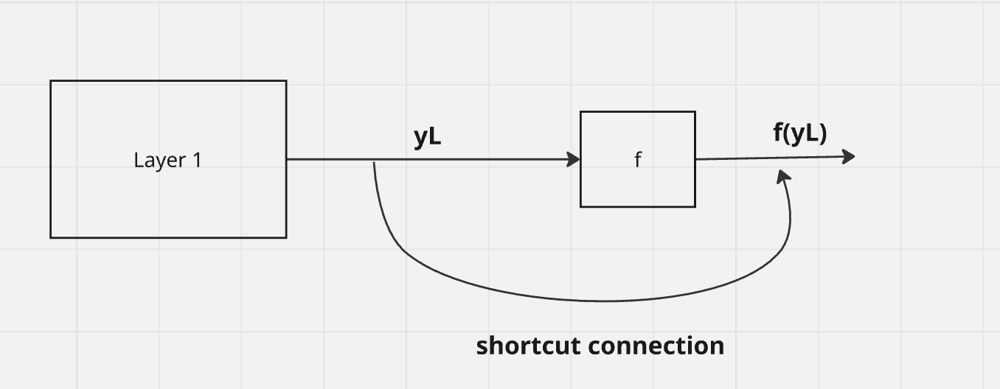

y<sub>L+1</sub> = f(y<sub>L</sub>) + y<sub>L</sub>

Chain Rule: $\frac{\partial L}{\partial y_L} = \frac{\partial L}{\partial y_{L+1}} \cdot \frac{\partial y_{L+1}}{\partial y_L}$

Derivative of $y_{L+1}$ with respect to $y_L$:

$\frac{\partial y_{L+1}}{\partial y_L} = \frac{\partial f(y_L)}{\partial y_L} + 1$ or $f'(y_L) + 1$


so
$\frac{\partial L}{\partial y_L} = \frac{\partial L}{\partial y_{L+1}} \cdot (f'(y_L) + 1)$


During propagation, the partial derivative of f with respect to y_L can become small due to the accumulation of different gradients. By the time we reach the first layer, the term within the brackets, which I'm highlighting now, might approach zero because of the vanishing gradient problem. However, this issue is mitigated by the inclusion of the plus one term, thanks to the shortcut connection. This additional term is the key contribution of the shortcut connection. Without it, the vanishing gradient problem would not be effectively addressed.

</div>

<div class="alert alert-block alert-success">

<h3> Visualizing shortcut connections</h3>

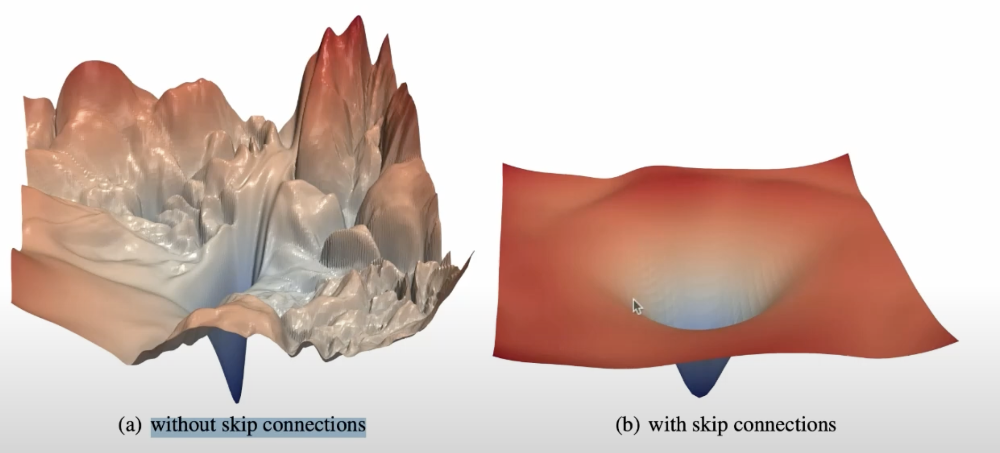

incorporating skip connections assists in transitioning from the left, where the loss function exhibits numerous oscillations and lacks smoothness, to the right, where the loss function becomes noticeably smoother.

</div>

<div class="alert alert-block alert-success">


The comparison between a deep neural network consisting of five layers without (left) and with shortcut connections (right). Shortcut connections involve adding the inputs of a layer to its outputs, effectively creating an alternate path that bypasses certain layers. The gradients denote the mean absolute gradient at each layer, which we compute

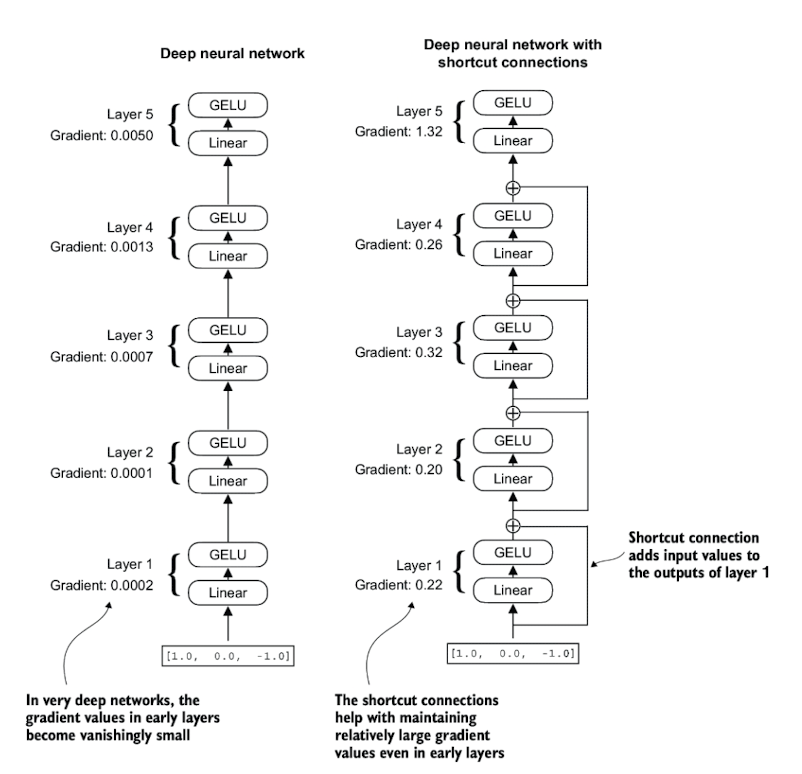


</div>

<div class="alert alert-block alert-success">

Let us see how we can add shortcut connections to the forward method:

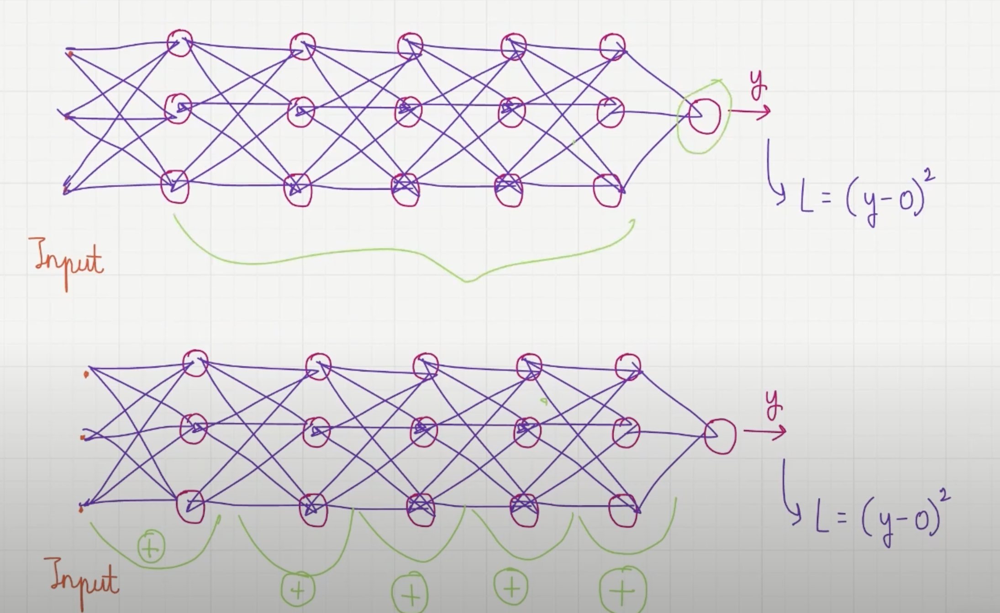


</div>

In [7]:
class ExampleDeepNeuralNetwork(nn.Module):
    def __init__(self, layer_sizes, use_shortcut):
        super().__init__()
        self.use_shortcut = use_shortcut
        self.layers = nn.ModuleList([
            nn.Sequential(nn.Linear(layer_sizes[0], layer_sizes[1]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[1], layer_sizes[2]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[2], layer_sizes[3]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[3], layer_sizes[4]), GELU()),
            nn.Sequential(nn.Linear(layer_sizes[4], layer_sizes[5]), GELU())
        ])

    def forward(self, x):
        for layer in self.layers:
            # Compute the output of the current layer
            layer_output = layer(x)
            # Check if shortcut can be applied
            if self.use_shortcut and x.shape == layer_output.shape:
                x = x + layer_output
            else:
                x = layer_output
        return x


<div class="alert alert-block alert-info">

The code implements a deep neural network with 5 layers, each consisting of a Linear
layer and a GELU activation function. 

In the forward pass, we iteratively pass the input
through the layers and optionally add the shortcut connections  if
the self.use_shortcut attribute is set to True.
</div>

<div class="alert alert-block alert-success">

Let's use this code to first initialize a neural network without shortcut connections. Here,
each layer will be initialized such that it accepts an example with 3 input values and returns
3 output values. The last layer returns a single output value:
</div>

In [8]:
layer_sizes = [3, 3, 3, 3, 3, 1]
sample_input = torch.tensor([[1., 0., -1.]])
torch.manual_seed(123) # specify random seed for the initial weights for reproducibility
model_without_shortcut = ExampleDeepNeuralNetwork(
layer_sizes, use_shortcut=False
)

<div class="alert alert-block alert-success">

Next, we implement a function that computes the gradients in the the model's backward
pass:
</div>

In [9]:
def print_gradients(model, x):
    # Forward pass
    output = model(x)
    target = torch.tensor([[0.]])

    # Calculate loss based on how close the target
    # and output are
    loss = nn.MSELoss()
    loss = loss(output, target)
    
    # Backward pass to calculate the gradients
    loss.backward()

    for name, param in model.named_parameters():
        if 'weight' in name:
            # Print the mean absolute gradient of the weights
            print(f"{name} has gradient mean of {param.grad.abs().mean().item()}")

<div class="alert alert-block alert-warning">

In the preceding code, we specify a loss function that computes how close the model output
and a user-specified target (here, for simplicity, the value 0) are. 

Then, when calling loss.backward(), PyTorch computes the loss gradient for each layer in the model. 

We can iterate through the weight parameters via model.named_parameters(). 

Suppose we have a 3×3 weight parameter matrix for a given layer. 

In that case, this layer will have 3×3 gradient values, and we print the mean absolute gradient of these 3×3 gradient values to
obtain a single gradient value per layer to compare the gradients between layers more
easily.
</div>

<div class="alert alert-block alert-warning">

In short, the .backward() method is a convenient method in PyTorch that computes loss
gradients, which are required during model training, without implementing the math for the
gradient calculation ourselves, thereby making working with deep neural networks much
more accessible. 
</div>

<div class="alert alert-block alert-success">

Let's now use the print_gradients function and apply it to the model without skip
connections:
</div>

In [10]:
print_gradients(model_without_shortcut, sample_input)

layers.0.0.weight has gradient mean of 0.00020173587836325169
layers.1.0.weight has gradient mean of 0.00012011159560643137
layers.2.0.weight has gradient mean of 0.0007152039906941354
layers.3.0.weight has gradient mean of 0.0013988736318424344
layers.4.0.weight has gradient mean of 0.005049645435065031


<div class="alert alert-block alert-info">
As we can see based on the output of the print_gradients function, the gradients become
smaller as we progress from the last layer (layers.4) to the first layer (layers.0), which
is a phenomenon called the vanishing gradient problem.
    
</div>

<div class="alert alert-block alert-success">
Let's now instantiate a model with skip connections and see how it compares:
</div>

In [11]:
torch.manual_seed(123)
model_with_shortcut = ExampleDeepNeuralNetwork(
layer_sizes, use_shortcut=True
)
print_gradients(model_with_shortcut, sample_input)

layers.0.0.weight has gradient mean of 0.22169792652130127
layers.1.0.weight has gradient mean of 0.20694106817245483
layers.2.0.weight has gradient mean of 0.32896995544433594
layers.3.0.weight has gradient mean of 0.2665732204914093
layers.4.0.weight has gradient mean of 1.3258540630340576


<div class="alert alert-block alert-info">
As we can see, based on the output, the last layer (layers.4) still has a larger gradient
than the other layers. 

However, the gradient value stabilizes as we progress towards the
first layer (layers.0) and doesn't shrink to a vanishingly small value.
</div>

<div class="alert alert-block alert-warning">

In conclusion, shortcut connections are important for overcoming the limitations posed
by the vanishing gradient problem in deep neural networks. 

Shortcut connections are a core building block of very large models such as LLMs, and they will help facilitate more effective
training by ensuring consistent gradient flow across layers when we train the GPT model 
</div>

<h2> Gradient descent</h2>

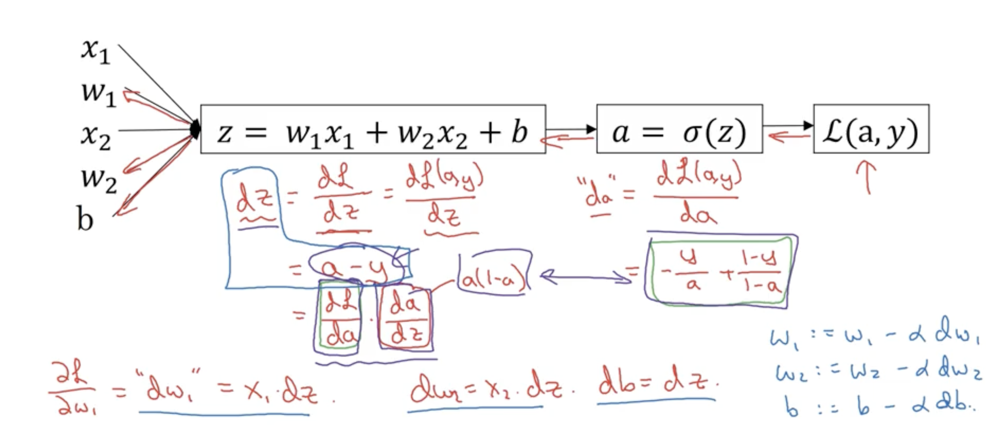